Selected Sentinel-1 file: patch_00042_e6bff2f8_20190811T220109+0000_res1024.tiff
Matched Sentinel-2 file: patch_00042_e6bff2f8_20230626T024015.290000+0000_res1024.tiff


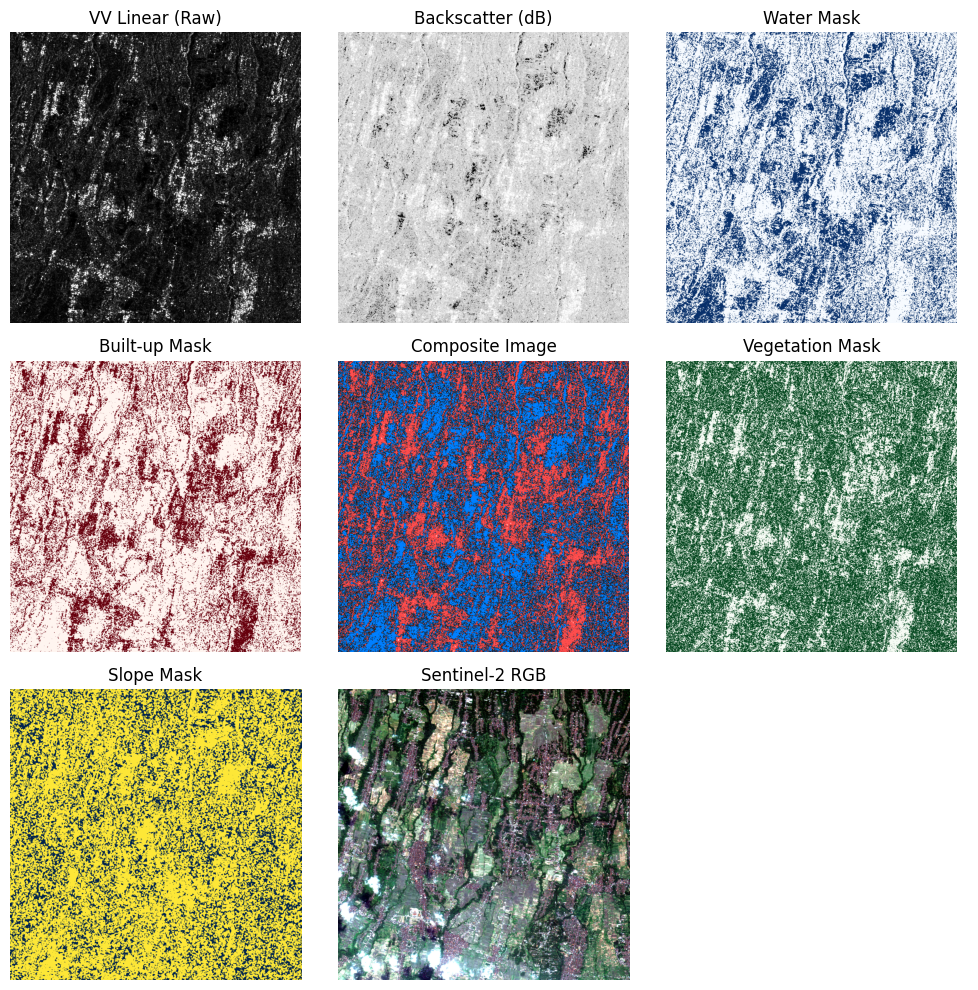

In [8]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
import tifffile as tiff
from scipy.ndimage import generic_filter

# --- Settings ---
folder_path = "../data/processed/sentinel1"
tiff_files = [f for f in os.listdir(folder_path) if f.endswith(".tiff")]

# Select a random Sentinel-1 image
random_file = random.choice(tiff_files)
image_path = os.path.join(folder_path, random_file)
print(f"Selected Sentinel-1 file: {random_file}")

# Extract patch_id prefix (e.g. patch_00032_5925311e)
patch_id = "_".join(random_file.split("_")[:2])

# Load Sentinel-1 image
image = tiff.imread(image_path)
if image.ndim == 3 and image.shape[0] == 1:
    image = image[0]

# Convert to dB
image_db = 10 * np.log10(image + 1e-6)

# Raw masks
# water_mask = image_db < -17
# builtup_mask = image_db > -8
# vegetation_mask = (image_db > -15) & (image_db < -10)

# --- Generate masks ---
local_std = generic_filter(image_db, np.std, size=5)
water_mask = (image_db < -12) #& (local_std < 0.7)
builtup_mask = (image_db > -8) & (local_std > 0.7)
vegetation_mask = ((image_db > -16) & (image_db < -8)) & (local_std > 0.3)

# Slope estimation: local std
local_std = generic_filter(image_db, np.std, size=5)
slope_mask = local_std > 2.5

# Normalize VV
def normalize(img):
    return (img - np.min(img)) / (np.max(img) - np.min(img))
vv_norm = normalize(image)

# Composite RGB with overlays
rgb = np.stack([vv_norm, vv_norm, vv_norm], axis=-1)
rgb[water_mask] = [0.0, 0.5, 1.0]
rgb[builtup_mask] = [1.0, 0.3, 0.3]

# --- Load Sentinel-2 processed RGB image ---
s2_folder = "../data/processed/sentinel2"
s2_candidates = [f for f in os.listdir(s2_folder) if f.startswith(patch_id) and f.endswith(".tiff")]

if s2_candidates:
    s2_file = os.path.join(s2_folder, s2_candidates[0])
    print(f"Matched Sentinel-2 file: {s2_candidates[0]}")
    s2_image = tiff.imread(s2_file)

    if s2_image.ndim == 3 and s2_image.shape[0] >= 4:
        s2_transposed = np.transpose(s2_image, (1, 2, 0))  # (bands, H, W) → (H, W, bands)
        s2_rgb = s2_transposed[:, :, [3, 2, 1]]  # Bands B04, B03, B02 → RGB
        # s2_rgb = np.clip(s2_rgb / 3000, 0, 1)  # normalize for display
    else:
        s2_rgb = np.ones((*image.shape, 3)) * 0.5  # fallback gray
        print("⚠️ Sentinel-2 image shape unexpected.")
else:
    s2_rgb = np.ones((*image.shape, 3)) * 0.5
    print("⚠️ No matching Sentinel-2 image found.")

# --- Plot in 3×3 grid ---
fig, axs = plt.subplots(3, 3, figsize=(10, 10))
axs = axs.flatten()

titles = [
    "VV Linear (Raw)",
    "Backscatter (dB)",
    "Water Mask",
    "Built-up Mask",
    "Composite Image",
    "Vegetation Mask",
    "Slope Mask",
    "Sentinel-2 RGB",
    ""  # Empty slot
]

images = [
    vv_norm,
    image_db,
    water_mask,
    builtup_mask,
    rgb,
    vegetation_mask,
    slope_mask,
    s2_rgb,
    np.ones_like(vv_norm) * np.nan
]

cmaps = [
    "gray",
    "gray",
    "Blues",
    "Reds",
    None,
    "Greens",
    "cividis",
    None,
    "gray"
]

for i in range(9):
    if i in [4, 7]:  # RGB images
        axs[i].imshow(images[i])
    elif i == 8:
        axs[i].axis("off")
        axs[i].set_title(titles[i])
        continue
    else:
        axs[i].imshow(images[i], cmap=cmaps[i])
    axs[i].set_title(titles[i])
    axs[i].axis("off")

plt.tight_layout()
plt.show()


Selected Sentinel-1 image: patch_00043_691c8352_20200220T215231+0000_res1024.tiff
🔍 Checking patch_00043_691c8352_20200128T024008.693000+0000_res1024: Δ=23 days | black=8.24%, white=12.61%
❌ Skipped due to threshold limits
🔍 Checking patch_00043_691c8352_20200318T024012.142000+0000_res1024: Δ=27 days | black=5.10%, white=21.72%
❌ Skipped due to threshold limits
🔍 Checking patch_00043_691c8352_20200123T024006.325000+0000_res1024: Δ=28 days | black=10.01%, white=19.51%
❌ Skipped due to threshold limits
🔍 Checking patch_00043_691c8352_20200118T024009.725000+0000_res1024: Δ=33 days | black=6.38%, white=8.95%
✅ Accepted


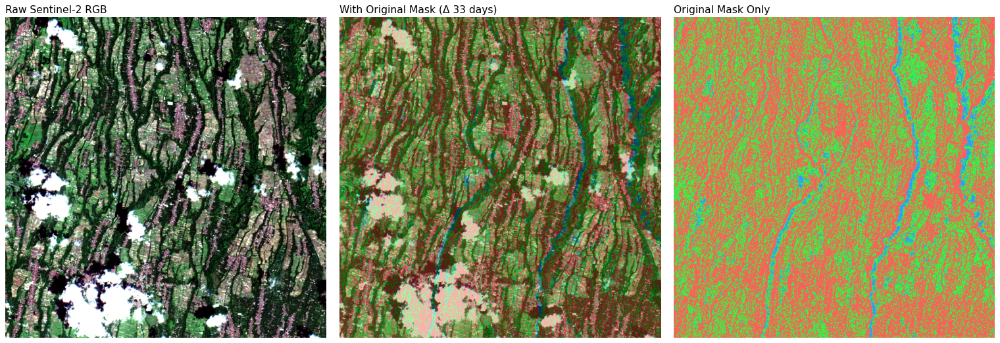

Selected Sentinel-1 image: patch_00034_1558c231_20180829T215227+0000_res1024.tiff
🔍 Checking patch_00034_1558c231_20180829T025009.407000+0000_res1024: Δ=0 days | black=93.79%, white=3.91%
❌ Skipped due to threshold limits
🔍 Checking patch_00034_1558c231_20180903T025001.834000+0000_res1024: Δ=5 days | black=77.43%, white=7.41%
❌ Skipped due to threshold limits
🔍 Checking patch_00034_1558c231_20180821T024008.564000+0000_res1024: Δ=8 days | black=9.50%, white=29.05%
❌ Skipped due to threshold limits
🔍 Checking patch_00034_1558c231_20180913T025001.912000+0000_res1024: Δ=15 days | black=84.70%, white=3.59%
❌ Skipped due to threshold limits
🔍 Checking patch_00034_1558c231_20180809T025010.670000+0000_res1024: Δ=20 days | black=89.39%, white=8.44%
❌ Skipped due to threshold limits
🔍 Checking patch_00034_1558c231_20180925T024011.367000+0000_res1024: Δ=27 days | black=7.62%, white=19.21%
❌ Skipped due to threshold limits
🔍 Checking patch_00034_1558c231_20180928T025006.950000+0000_res1024: Δ=30 d

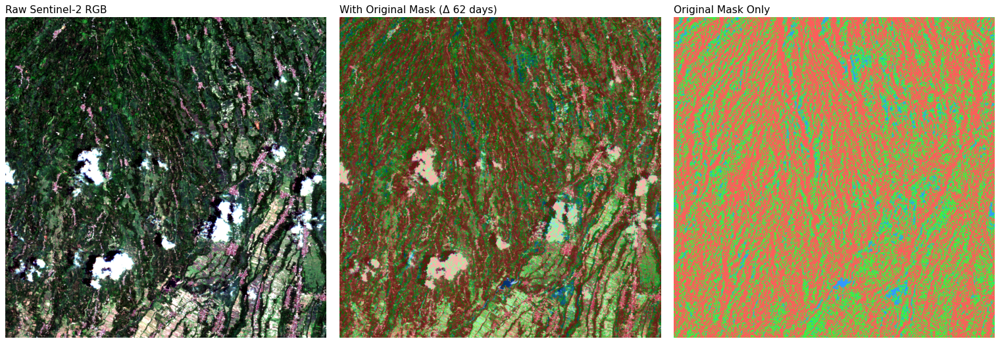

Selected Sentinel-1 image: patch_00033_4e36ed13_20190330T104033+0000_res1024.tiff
🔍 Checking patch_00033_4e36ed13_20190423T024019.037000+0000_res1024: Δ=24 days | black=7.42%, white=5.74%
✅ Accepted


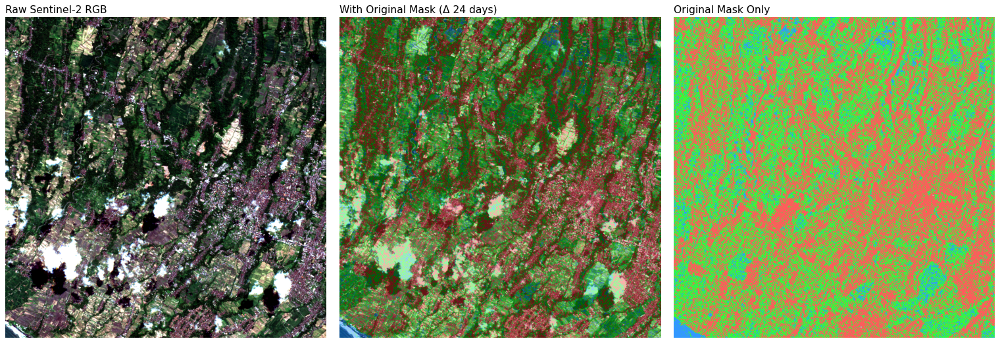

Selected Sentinel-1 image: patch_00042_e6bff2f8_20190619T215305+0000_res1024.tiff
🔍 Checking patch_00042_e6bff2f8_20190617T024023.421000+0000_res1024: Δ=2 days | black=9.80%, white=57.65%
❌ Skipped due to threshold limits
🔍 Checking patch_00042_e6bff2f8_20190622T024017.112000+0000_res1024: Δ=3 days | black=2.22%, white=54.78%
❌ Skipped due to threshold limits
🔍 Checking patch_00042_e6bff2f8_20190627T024021.420000+0000_res1024: Δ=8 days | black=7.55%, white=44.33%
❌ Skipped due to threshold limits
🔍 Checking patch_00042_e6bff2f8_20190707T024021.835000+0000_res1024: Δ=18 days | black=5.31%, white=4.38%
✅ Accepted


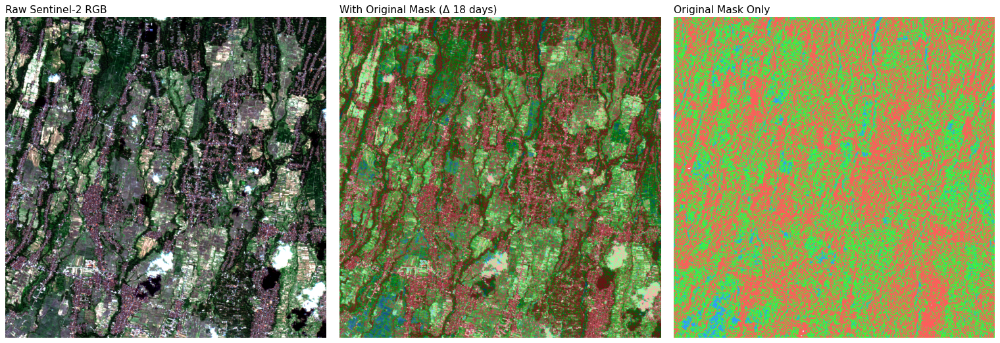

In [9]:
import os
import json
import numpy as np
import matplotlib.pyplot as plt
import tifffile as tiff
from datetime import datetime
from scipy.ndimage import generic_filter, binary_opening, binary_closing

# --- Config ---
dpi = 80
alpha = 0.4

for _ in range(4):
    # --- Select random Sentinel-1 image ---
    s1_folder = "../data/processed/sentinel1"
    s1_files = [f for f in os.listdir(s1_folder) if f.endswith(".tiff")]
    random_file = np.random.choice(s1_files)
    s1_path = os.path.join(s1_folder, random_file)
    print(f"Selected Sentinel-1 image: {random_file}")

    # Extract patch_id and date
    parts = random_file.split("_")
    patch_id = "_".join(parts[:2])
    if len(parts) >= 4 and parts[3][:8].isdigit():
        sentinel1_date = datetime.strptime(parts[3][:8], "%Y%m%d")
    else:
        raise ValueError(f"Could not extract date from filename: {random_file}")

    # Load Sentinel-1 image
    image = tiff.imread(s1_path)
    if image.ndim == 3 and image.shape[0] == 1:
        image = image[0]
    image_db = 10 * np.log10(image + 1e-6)

    # --- Generate masks ---
    local_std = generic_filter(image_db, np.std, size=5)
    water_mask = (image_db < -12) #& (local_std < 0.7)
    builtup_mask = (image_db > -8) & (local_std > 0.7)
    vegetation_mask = ((image_db > -16) & (image_db < -8)) & (local_std > 0.3)

    # --- Find closest usable Sentinel-2 image ---
    s2_folder = "../data/processed/sentinel2"
    json_candidates = [f for f in os.listdir(s2_folder) if f.startswith(patch_id) and f.endswith(".json")]

    date_file_pairs = []
    for json_file in json_candidates:
        json_path = os.path.join(s2_folder, json_file)
        try:
            with open(json_path, "r") as f:
                meta = json.load(f)
                timestamp = meta.get("timestamp", "")
                if timestamp:
                    s2_date = datetime.strptime(timestamp[:10], "%Y-%m-%d")
                    delta = abs((sentinel1_date - s2_date).days)
                    base_name = os.path.splitext(json_file)[0]
                    date_file_pairs.append((delta, base_name))
        except Exception as e:
            print(f"⚠️ Failed reading {json_path}: {e}")

    date_file_pairs.sort(key=lambda x: x[0])

    s2_rgb = None
    min_days_diff = None

    for delta, base_name in date_file_pairs:
        s2_file = os.path.join(s2_folder, base_name + ".tiff")
        if not os.path.exists(s2_file):
            continue
        try:
            s2_image = tiff.imread(s2_file)
            if s2_image.ndim == 3 and s2_image.shape[0] >= 4:
                s2_transposed = np.transpose(s2_image, (1, 2, 0))
                s2_rgb_temp = s2_transposed[:, :, [3, 2, 1]]

                black_mask = np.all(s2_rgb_temp < 0.05, axis=-1)     # strict dark
                white_mask = np.any(s2_rgb_temp > 0.95, axis=-1)     # any channel very bright

                black_ratio = np.mean(black_mask)
                white_ratio = np.mean(white_mask)

                print(f"🔍 Checking {base_name}: Δ={delta} days | black={black_ratio:.2%}, white={white_ratio:.2%}")

                if black_ratio <= 0.1 and white_ratio <= 0.1:
                    s2_rgb = s2_rgb_temp
                    min_days_diff = delta
                    print("✅ Accepted")
                    break
                else:
                    print("❌ Skipped due to threshold limits")
        except Exception as e:
            print(f"⚠️ Could not read image {s2_file}: {e}")


    if s2_rgb is None:
        print("❌ No valid Sentinel-2 image found — fallback gray")
        s2_rgb = np.ones((*image.shape, 3)) * 0.5

    # --- Helper to generate RGBA overlays ---
    def create_overlay(w_mask, v_mask, b_mask, alpha=0.3):
        overlay = np.zeros((*w_mask.shape, 4), dtype=np.float32)
        overlay[w_mask] = [0.0, 0.5, 1.0, alpha]
        overlay[v_mask] = [0.0, 1.0, 0.0, alpha]
        overlay[b_mask] = [1.0, 0.2, 0.2, alpha]
        return overlay

    # --- Overlays ---
    overlay_raw_2 = create_overlay(water_mask, vegetation_mask, builtup_mask, alpha=0.8)
    overlay_raw = create_overlay(water_mask, vegetation_mask, builtup_mask, alpha=alpha)

    # --- Plot 1x3 Grid ---
    height, width = s2_rgb.shape[:2]
    figsize = (3 * width * 0.5 / dpi, height * 0.5 / dpi)
    fig, axs = plt.subplots(1, 3, figsize=figsize, dpi=dpi)

    # 1. Raw Sentinel-2
    axs[0].imshow(s2_rgb)
    axs[0].axis("off")
    axs[0].set_title("Raw Sentinel-2 RGB", fontsize=14, loc='left')

    # 2. Sentinel-2 + Original Mask
    axs[1].imshow(s2_rgb)
    axs[1].imshow(overlay_raw)
    axs[1].axis("off")
    axs[1].set_title(f"With Original Mask (Δ {min_days_diff} days)", fontsize=14, loc='left')

    # 3. Mask Only (no background)
    blank = np.ones_like(s2_rgb)
    axs[2].imshow(blank)
    axs[2].imshow(overlay_raw_2)
    axs[2].axis("off")
    axs[2].set_title("Original Mask Only", fontsize=14, loc='left')

    plt.tight_layout()
    plt.show()

